In [1]:
!git clone http://github.com/tensorflow/examples
%cd examples/tensorflow_examples/lite/model_maker/pip_package

Cloning into 'examples'...
remote: Enumerating objects: 23737, done.
remote: Counting objects: 100% (701/701), done.
remote: Compressing objects: 100% (419/419), done.
remote: Total 23737 (delta 231), reused 564 (delta 194), pack-reused 23036
Receiving objects: 100% (23737/23737), 44.18 MiB | 43.42 MiB/s, done.
Resolving deltas: 100% (12880/12880), done.
/content/examples/tensorflow_examples/lite/model_maker/pip_package


In [ ]:
!pip install -e .

In [ ]:
#!sudo apt -y install libportaudio2

In [43]:
#!mkdir /content/datasets
#%cd /content/datasets



!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="rUYy1neZ9iPnj6hyBsim")
project = rf.workspace("project-ynhfw").project("graffiti-detection-ibxz4")
dataset = project.version(3).download("voc")


/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Graffiti-detection-3 in voc:: 100%|██████████| 2111/2111 [00:00<00:00, 3648.05it/s]


In [1]:
!mkdir /content/datasets
%cd /content/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="rUYy1neZ9iPnj6hyBsim")
project = rf.workspace("project-ynhfw").project("graffiti-detection-ibxz4")
dataset = project.version(2).download("voc")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 24.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing in

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Graffiti-detection-2 in voc:: 100%|██████████| 2111/2111 [00:00<00:00, 7216.99it/s]


In [1]:
import os
import numpy as np
import tensorflow as tf
assert tf.__version__.startswith('2')
from tflite_model_maker import model_spec
from tflite_model_maker import object_detector
from tflite_model_maker.config import ExportFormat
from tflite_model_maker.object_detector import DataLoader

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [132]:
import shutil

# Specify the path of the folder you want to delete
folder_path = '/content/datasets'

# Remove the non-empty directory
shutil.rmtree(folder_path)

print(f"The folder at {folder_path} has been deleted.")

The folder at /content/datasets has been deleted.


In [ ]:
#!mkdir /content/datasets
#%cd /content/datasets

#!pip install roboflow

#from roboflow import Roboflow
#rf = Roboflow(api_key="rUYy1neZ9iPnj6hyBsim")
#project = rf.workspace("project-ynhfw").project("graffiti-detection-ibxz4")
#dataset = project.version(2).download("tensorflow")


In [2]:
train_data = object_detector.DataLoader.from_pascal_voc("/content/datasets/Graffiti-detection-2/train","/content/datasets/Graffiti-detection-2/train", label_map={1: 'Graffiti'})


In [3]:
val_data = object_detector.DataLoader.from_pascal_voc("/content/datasets/Graffiti-detection-2/valid","/content/datasets/Graffiti-detection-2/valid", label_map={1: 'Graffiti'})


In [4]:
test_data = object_detector.DataLoader.from_pascal_voc("/content/datasets/Graffiti-detection-2/test","/content/datasets/Graffiti-detection-2/test", label_map={1: 'Graffiti'})


In [55]:
train_data

In [5]:
spec = model_spec.get('efficientdet_lite4')


In [ ]:
#print(spec.model.summary())
 model_name='efficientdet-lite4',
    uri='https://tfhub.dev/tensorflow/efficientdet/lite4/feature-vector/2',
    hparams='',
    model_dir=None,
    epochs=50,
    batch_size=64,
    steps_per_execution=1,
    moving_average_decay=0,
    var_freeze_expr='(efficientnet|fpn_cells|resample_p6)',
    tflite_max_detections=25,
    strategy=None,
    tpu=None,
    gcp_project=None,
    tpu_zone=None,
    use_xla=False,
    profile=False,
    debug=False,
    tf_random_seed=111111,
    verbose=0

In [ ]:
model = object_detector.create(train_data, model_spec=spec, batch_size=16, epochs=50 , validation_data=val_data,  model_dir= "/content/trained_model" ,  steps_per_execution=1 , tpu= T4 GPU  )


In [6]:
#model = object_detector.create(train_data, model_spec=spec, batch_size=8, train_whole_model=True, epochs=50 , validation_data=val_data )


Epoch 1/50
115/115 [==============================] - 1405s 12s/step - det_loss: 1.4428 - cls_loss: 0.8486 - box_loss: 0.0119 - reg_l2_loss: 0.1078 - loss: 1.5506 - learning_rate: 0.0090 - gradient_norm: 4.0796 - val_det_loss: 1.0055 - val_cls_loss: 0.6484 - val_box_loss: 0.0071 - val_reg_l2_loss: 0.1080 - val_loss: 1.1135
Epoch 2/50
115/115 [==============================] - 1349s 12s/step - det_loss: 0.9102 - cls_loss: 0.5207 - box_loss: 0.0078 - reg_l2_loss: 0.1084 - loss: 1.0186 - learning_rate: 0.0100 - gradient_norm: 5.9280 - val_det_loss: 1.0140 - val_cls_loss: 0.6715 - val_box_loss: 0.0069 - val_reg_l2_loss: 0.1088 - val_loss: 1.1229
Epoch 3/50
115/115 [==============================] - 1323s 12s/step - det_loss: 0.8473 - cls_loss: 0.4713 - box_loss: 0.0075 - reg_l2_loss: 0.1091 - loss: 0.9564 - learning_rate: 0.0099 - gradient_norm: 5.4130 - val_det_loss: 0.7996 - val_cls_loss: 0.4917 - val_box_loss: 0.0062 - val_reg_l2_loss: 0.1094 - val_loss: 0.9089
Epoch 4/50
115/115 [=====

In [5]:
#from tflite_model_maker import object_detector, model_spec

# Specify your model specification
spec = model_spec.get('efficientdet_lite4')

# Train the model for a conservative number of epochs
model = object_detector.create(
    train_data,
    model_spec=spec,
    batch_size=16,
    train_whole_model=True,
    epochs=2,  # Start with a lower number of epochs to avoid overfitting
    validation_data=val_data
)




Epoch 1/2
57/57 [==============================] - 1530s 26s/step - det_loss: 1.6057 - cls_loss: 0.9782 - box_loss: 0.0125 - reg_l2_loss: 0.1078 - loss: 1.7134 - learning_rate: 0.0140 - gradient_norm: 2.0910 - val_det_loss: 1.2614 - val_cls_loss: 0.7387 - val_box_loss: 0.0105 - val_reg_l2_loss: 0.1078 - val_loss: 1.3692
Epoch 2/2
57/57 [==============================] - 1460s 26s/step - det_loss: 1.0357 - cls_loss: 0.5980 - box_loss: 0.0088 - reg_l2_loss: 0.1080 - loss: 1.1436 - learning_rate: 0.0100 - gradient_norm: 4.5294 - val_det_loss: 0.8659 - val_cls_loss: 0.5015 - val_box_loss: 0.0073 - val_reg_l2_loss: 0.1081 - val_loss: 0.9740


In [56]:
model = object_detector.create(train_data, model_spec=spec, batch_size=8, train_whole_model=True, epochs=2 , validation_data=val_data )


Epoch 1/2
115/115 [==============================] - 1597s 13s/step - det_loss: 1.4130 - cls_loss: 0.8396 - box_loss: 0.0115 - reg_l2_loss: 0.1079 - loss: 1.5209 - learning_rate: 0.0090 - gradient_norm: 4.2461 - val_det_loss: 1.5355 - val_cls_loss: 1.0118 - val_box_loss: 0.0105 - val_reg_l2_loss: 0.1081 - val_loss: 1.6435
Epoch 2/2
115/115 [==============================] - 1518s 13s/step - det_loss: 1.0029 - cls_loss: 0.5838 - box_loss: 0.0084 - reg_l2_loss: 0.1082 - loss: 1.1111 - learning_rate: 0.0050 - gradient_norm: 6.5793 - val_det_loss: 1.2077 - val_cls_loss: 0.7442 - val_box_loss: 0.0093 - val_reg_l2_loss: 0.1084 - val_loss: 1.3161


In [117]:
model = object_detector.create(train_data, model_spec=spec, batch_size=8, train_whole_model=True, epochs=15 , validation_data=val_data )


Epoch 1/15
115/115 [==============================] - 1530s 13s/step - det_loss: 1.4566 - cls_loss: 0.8745 - box_loss: 0.0116 - reg_l2_loss: 0.1079 - loss: 1.5645 - learning_rate: 0.0090 - gradient_norm: 5.0123 - val_det_loss: 1.3844 - val_cls_loss: 0.8557 - val_box_loss: 0.0106 - val_reg_l2_loss: 0.1083 - val_loss: 1.4926
Epoch 2/15
115/115 [==============================] - 1485s 13s/step - det_loss: 0.9916 - cls_loss: 0.5645 - box_loss: 0.0085 - reg_l2_loss: 0.1087 - loss: 1.1004 - learning_rate: 0.0097 - gradient_norm: 5.8405 - val_det_loss: 1.0253 - val_cls_loss: 0.6739 - val_box_loss: 0.0070 - val_reg_l2_loss: 0.1090 - val_loss: 1.1344
Epoch 3/15
115/115 [==============================] - 1465s 13s/step - det_loss: 0.8549 - cls_loss: 0.4957 - box_loss: 0.0072 - reg_l2_loss: 0.1093 - loss: 0.9642 - learning_rate: 0.0092 - gradient_norm: 5.3136 - val_det_loss: 1.1381 - val_cls_loss: 0.7499 - val_box_loss: 0.0078 - val_reg_l2_loss: 0.1095 - val_loss: 1.2477
Epoch 4/15
115/115 [=====

In [118]:
model.summary()

Model: ""
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  multiple                  15092016  
                                                                 
 class_net/class-predict (S  multiple                  6066      
 eparableConv2D)                                                 
                                                                 
 box_net/box-predict (Separ  multiple                  10116     
 ableConv2D)                                                     
                                                                 
Total params: 15108198 (57.63 MB)
Trainable params: 14952694 (57.04 MB)
Non-trainable params: 155504 (607.44 KB)
_________________________________________________________________


In [119]:
model.export(export_dir='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/15 epoch/model', export_format=[ExportFormat.SAVED_MODEL, ExportFormat.LABEL])

In [120]:
model.export(export_dir='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/15 epoch/model')

In [15]:
# Step 1: Load the saved model
saved_model_path = '/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/saved_model'
loaded_model = tf.saved_model.load(saved_model_path)

In [24]:
import cv2

from PIL import Image

model_path = '/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/model.tflite'
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Load the labels into a list
classes = ['Graffiti']
#label_map = model.model_spec.config.label_map
#for label_id, label_name in label_map.as_dict().items():
 # classes[label_id-1] = label_name

# Define a list of colors for visualization
COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype="uint8")

def preprocess_image(image_path, input_size):
  """Preprocess the input image to feed to the TFLite model"""
  img = tf.io.read_file(image_path)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.uint8)
  original_image = img
  resized_img = tf.image.resize(img, input_size)
  resized_img = resized_img[tf.newaxis, :]
  resized_img = tf.cast(resized_img, dtype=tf.uint8)
  return resized_img, original_image


def detect_objects(interpreter, image, threshold=0.5):
    """Detect objects in an image and return bounding box info."""
    signature_fn = interpreter.get_signature_runner()

    # Feed the input image to the model
    output = signature_fn(images=image)

    # Get all outputs from the model
    count = int(np.squeeze(output['output_0']))
    scores = np.squeeze(output['output_1'])
    classes = np.squeeze(output['output_2'])
    boxes = np.squeeze(output['output_3'])

    # Initialize a list to store detected objects' info
    detected_objects = []
    for i in range(count):
        if scores[i] >= threshold:
            # Each object's info is stored as a dictionary
            obj_info = {
                'bounding_box': boxes[i].tolist(),  # Convert numpy array to list
                'class_id': int(classes[i]),
                'score': float(scores[i])
            }
            detected_objects.append(obj_info)

    return detected_objects


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
  """Run object detection on the input image and draw the detection results"""
  # Load the input shape required by the model
  _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

  # Load the input image and preprocess it
  preprocessed_image, original_image = preprocess_image(
      image_path,
      (input_height, input_width)
    )

  # Run object detection on the input image
  results = detect_objects(interpreter, preprocessed_image, threshold=threshold)

  # Plot the detection results on the input image
  original_image_np = original_image.numpy().astype(np.uint8)
  for obj in results:
    # Convert the object bounding box from relative coordinates to absolute
    # coordinates based on the original image resolution
    ymin, xmin, ymax, xmax = obj['bounding_box']
    xmin = int(xmin * original_image_np.shape[1])
    xmax = int(xmax * original_image_np.shape[1])
    ymin = int(ymin * original_image_np.shape[0])
    ymax = int(ymax * original_image_np.shape[0])

    # Find the class index of the current object
    class_id = int(obj['class_id'])

    # Draw the bounding box and label on the image
    color = [int(c) for c in COLORS[class_id]]
    cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), color, 2)
    # Make adjustments to make the label visible for all objects
    y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
    cv2.putText(original_image_np, label, (xmin, y),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  # Return the final image
  original_uint8 = original_image_np.astype(np.uint8)
  return original_uint8




<ipython-input-25-019f4af1783a>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  im.thumbnail((512, 512), Image.ANTIALIAS)


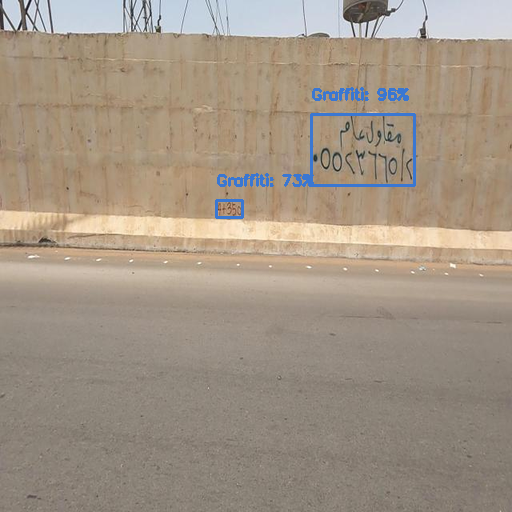

In [25]:
INPUT_IMAGE_URL = "/content/datasets/Graffiti-detection-2/test/03ea809773b3e96af83efff9b6182d98_jpg.rf.daa6a3e95ae3a88d2b1bd596345e5fe4.jpg"
DETECTION_THRESHOLD = 0.5

TEMP_FILE = "/content/datasets/Graffiti-detection-2/test/03ea809773b3e96af83efff9b6182d98_jpg.rf.daa6a3e95ae3a88d2b1bd596345e5fe4.jpg"

#!wget -q -O $TEMP_FILE $INPUT_IMAGE_URL
im = Image.open(TEMP_FILE)
im.thumbnail((512, 512), Image.ANTIALIAS)
im.save(TEMP_FILE, 'PNG')

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Run inference and draw detection result on the local copy of the original file
detection_result_image = run_odt_and_draw_results(
    TEMP_FILE,
    interpreter,
    threshold=DETECTION_THRESHOLD
)

# Show the detection result
Image.fromarray(detection_result_image)

In [40]:
import os
import cv2
from PIL import Image
import tensorflow as tf
import numpy as np

# Assuming other functions (preprocess_image, detect_objects, run_odt_and_draw_results) are defined as above

# Directory containing the test images
test_images_directory = "/content/datasets/Graffiti-detection-2/test"
# Directory to save the detection results
results_directory = '/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/detection_results2'

# Ensure the results directory exists
os.makedirs(results_directory, exist_ok=True)

# Iterate over all images in the directory
for image_filename in os.listdir(test_images_directory):
    # Construct the full path to the image file
    image_path = os.path.join(test_images_directory, image_filename)

    # Check if the file is an image (e.g., by checking the file extension)
    if image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Run inference and draw detection result on the image
        detection_result_image = run_odt_and_draw_results(
            image_path,
            interpreter,
            threshold=DETECTION_THRESHOLD
        )

        # Show or save the detection result
        # For example, to display the result using PIL:
        #Image.fromarray(detection_result_image).show()

        # Alternatively, to save the result to a file:
        result_image_path = os.path.join(results_directory, image_filename)
        Image.fromarray(detection_result_image).save(result_image_path)


In [41]:
import os
import xml.etree.ElementTree as ET

def extract_bounding_boxes(annotation_path):
    """Extract bounding boxes from a Pascal VOC annotation file."""
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    bounding_boxes = []
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        bounding_boxes.append([xmin, ymin, xmax, ymax])  # Using list for consistency
    return bounding_boxes

# Directory containing the annotation files
annotations_directory = "/content/datasets/Graffiti-detection-2/test"  # Ensure this path is correct

# Initialize the dictionary to hold ground truth data
ground_truth_data = {}

# Iterate over all annotation files in the directory to populate the dictionary
for annotation_filename in os.listdir(annotations_directory):
    if annotation_filename.endswith('.xml'):
        # Extracting the image filename from the annotation filename
        image_filename = annotation_filename.replace('.xml', '.jpg')  # Assuming the image extension is .jpg
        annotation_path = os.path.join(annotations_directory, annotation_filename)
        bounding_boxes = extract_bounding_boxes(annotation_path)

        # Add the bounding boxes to the dictionary using the image filename as the key
        ground_truth_data[image_filename] = bounding_boxes

# At this point, ground_truth_data is populated with image filenames as keys and their corresponding ground truth bounding boxes as values



In [ ]:
ground_truth_data

In [42]:
# Directory containing your test images
test_images_directory = "/content/datasets/Graffiti-detection-2/test"  # Ensure this is the correct path where the images are stored

# Initialize the dictionary to hold predicted data
predicted_data = {}

# Iterate over all images in the directory to populate the dictionary
for image_filename in os.listdir(test_images_directory):
    image_path = os.path.join(test_images_directory, image_filename)

    # Check if the file is an image
    if image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Load and preprocess the image
        input_height, input_width, _ = interpreter.get_input_details()[0]['shape'][1:]
        preprocessed_image, original_image = preprocess_image(image_path, (input_height, input_width))

        # Run object detection and get predicted bounding boxes
        predicted_objects = detect_objects(interpreter, preprocessed_image, threshold=DETECTION_THRESHOLD)

        # Extract just the bounding box coordinates from the predicted_objects
        predicted_boxes = [obj['bounding_box'] for obj in predicted_objects]

        # Add the predicted bounding boxes to the dictionary using the image filename as the key
        predicted_data[image_filename] = predicted_boxes

# At this point, predicted_data is populated with image filenames as keys and their corresponding predicted bounding boxes as values



In [ ]:
predicted_data

In [43]:
def calculate_iou(boxA, boxB):
    # Coordinates of intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Intersection area
    intersection_area = max(0, xB - xA) * max(0, yB - yA)

    # Areas of both rectangles
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Union area
    union_area = boxA_area + boxB_area - intersection_area

    # IoU
    iou = intersection_area / union_area
    return iou

def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        normalized_xmin = xmin / img_width
        normalized_ymin = ymin / img_height
        normalized_xmax = xmax / img_width
        normalized_ymax = ymax / img_height
        normalized_boxes.append([normalized_xmin, normalized_ymin, normalized_xmax, normalized_ymax])
    return normalized_boxes

# Image dimensions
image_width, image_height = 512, 512

# Normalize the ground truth boxes for each image
normalized_ground_truth_data = {image_id: normalize_boxes(gt_boxes, image_width, image_height)
                                for image_id, gt_boxes in ground_truth_data.items()}

# Calculate IoUs for each image
iou_results = {}
for image_id, gt_boxes in normalized_ground_truth_data.items():
    predicted_boxes_for_image = predicted_data.get(image_id, [])
    print(f"\nImage ID: {image_id}")
    print(f"Ground Truth Boxes: {gt_boxes}")
    print(f"Predicted Boxes (before conversion): {predicted_boxes_for_image}")

    ious_for_image = []

    for pred_box in predicted_boxes_for_image:
        # Convert pred_box from [center_x, center_y, width, height] to [x_min, y_min, x_max, y_max] in normalized format
        pred_box_converted = [pred_box[0] - pred_box[2]/2, pred_box[1] - pred_box[3]/2,
                              pred_box[0] + pred_box[2]/2, pred_box[1] + pred_box[3]/2]
        print(f"Converted Predicted Box: {pred_box_converted}")

        for gt_box in gt_boxes:
            iou = calculate_iou(pred_box_converted, gt_box)
            print(f"IOU between GT Box {gt_box} and Predicted Box {pred_box_converted}: {iou}")
            ious_for_image.append(iou)

    iou_results[image_id] = ious_for_image



Image ID: 3b147798c470499ea069ea1229aab29b_jpg.rf.ec4d9ba0792892282ebd9b28acc29800.jpg
Ground Truth Boxes: [[1.125, 0.5546875, 1.1875, 0.6015625], [1.064453125, 0.55859375, 1.1171875, 0.609375], [1.0, 0.55078125, 1.056640625, 0.599609375]]
Predicted Boxes (before conversion): [[0.4377202093601227, 0.8981889486312866, 0.4777463376522064, 0.9467275142669678], [0.4396939277648926, 0.802114725112915, 0.4757726192474365, 0.8398351669311523], [0.43671441078186035, 0.7969624996185303, 0.48409026861190796, 0.9448188543319702]]
Converted Predicted Box: [0.19884704053401947, 0.42482519149780273, 0.6765933781862259, 1.3715527057647705]
IOU between GT Box [1.125, 0.5546875, 1.1875, 0.6015625] and Predicted Box [0.19884704053401947, 0.42482519149780273, 0.6765933781862259, 1.3715527057647705]: 0.0
IOU between GT Box [1.064453125, 0.55859375, 1.1171875, 0.609375] and Predicted Box [0.19884704053401947, 0.42482519149780273, 0.6765933781862259, 1.3715527057647705]: 0.0
IOU between GT Box [1.0, 0.5507

In [82]:
def convert_bbox_format(bbox):
    """
    Converts a bounding box format from [x_center, y_center, width, height] to [x1, y1, x2, y2].
    Checks the length of bbox to ensure it contains 4 elements.
    """
    if len(bbox) != 4:
        raise ValueError(f"Expected bounding box with 4 elements, got {len(bbox)}: {bbox}")
    x_center, y_center, width, height = bbox
    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    return [x1, y1, x2, y2]


def calculate_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    intersection_area = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the area of union
    union_area = boxA_area + boxB_area - intersection_area

    # Compute the IoU
    iou = intersection_area / float(union_area)

    return iou

def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        normalized_xmin = xmin / img_width
        normalized_ymin = ymin / img_height
        normalized_xmax = xmax / img_width
        normalized_ymax = ymax / img_height
        normalized_boxes.append([normalized_xmin, normalized_ymin, normalized_xmax, normalized_ymax])
    return normalized_boxes

# Image dimensions
image_width, image_height = 512, 512

# Normalize the ground truth boxes for each image
normalized_ground_truth_data = {image_id: normalize_boxes(gt_boxes, image_width, image_height)
                                for image_id, gt_boxes in ground_truth_data.items()}

# Calculate IoU for each pair of normalized predicted and ground truth boxes within each image
iou_results = {}
for image_id in normalized_ground_truth_data.keys():
    gt_boxes = normalized_ground_truth_data[image_id]
    pred_boxes = predicted_data.get(image_id, [])
    ious = []
    for gt_box in gt_boxes:
        for pred_box in pred_boxes:
            try:
                # Convert pred_box from [x_center, y_center, width, height] to [x1, y1, x2, y2] in normalized format
                # Exclude confidence score if present
                pred_box_converted = convert_bbox_format(pred_box[:-1] if len(pred_box) > 4 else pred_box)
                iou = calculate_iou(gt_box, pred_box_converted)
                ious.append(iou)
            except ValueError as e:
                print(f"Error converting predicted box format for image {image_id}: {e}")

    iou_results[image_id] = ious

# `iou_results` now contains the IoUs for each pair of normalized predicted and ground truth boxes within each image


In [ ]:
normalized_ground_truth_data

In [44]:
 iou_results

{'3b147798c470499ea069ea1229aab29b_jpg.rf.ec4d9ba0792892282ebd9b28acc29800.jpg': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 '87bcead76eb233b42a317225aaca7280_jpg.rf.558e1cff8d561656666dddd347b6d83e.jpg': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.008283948453574252,
  0.06291619960629548,
  0.03227482293278741,
  0.03210980257087864,
  0.01624645099607117,
  0.0020413473035889216,
  0.0,
  0.01249546192310972,
  0.0027778819802634033,
  0.0,
  0.0,
  0.0,
  0.010946670874501905,
  0.06693826327856338,
  0.036740550521316744,
  0.05029471833021054,
  0.02013180850483109,
  0.0026962243533255924,
  0.010962974911943315,
  0.06703796153050395,
  0.03679527211824653,
  0.05857865130497333,
  0.020161792941504948,
  0.0027002401260944127,
  0.007467552163595145,
  0.045663652310719734,
  0.025063508411146924,
  0.03446272620908352,
  0.013733429266381875,
  0.0018392985624618582],
 '1e821bc00f2333f479d9c268161e8386_jpg.rf.cf88bb9edf9c3d0a8e73c68664a13338.jpg': [0.0,
 

In [47]:
# Assuming `iou_results` is a dictionary where each key is an image ID
# and each value is a list of IoU values for that image
all_ious = []

for image_id, ious in iou_results.items():
    # Filter out IoU values below a certain threshold if needed
    # For example, to consider only IoU > 0.5:
     filtered_ious = [iou for iou in ious if iou > 0.3]
     all_ious.extend(filtered_ious)

    # If you're not filtering by threshold, just extend the list
    #all_ious.extend(ious)

# Calculate mean IoU
if all_ious:  # Check to prevent division by zero
    mean_iou = sum(all_ious) / len(all_ious)
    print(f"Mean IoU: {mean_iou}")
else:
    print("No IoU values to calculate mean IoU.")


Mean IoU: 0.32393705878362866


In [51]:
iou_threshold = 0.0001
true_positives = 0
false_positives = 0
false_negatives = 0

for image_id, gt_boxes in normalized_ground_truth_data.items():
    predicted_boxes_for_image = iou_results.get(image_id, [])

    if not predicted_boxes_for_image:  # No predictions for this image
        false_negatives += len(gt_boxes)  # All ground truth boxes are false negatives
        continue

    matched_gt_boxes = set()
    for iou, pred_box in zip(predicted_boxes_for_image, gt_boxes):
        if iou >= iou_threshold:
            true_positives += 1
            matched_gt_boxes.add(tuple(pred_box))  # Using tuple to store the box coordinates as a hashable type
        else:
            false_positives += 1

    # Count ground truth boxes that were not matched as false negatives
    false_negatives += len(gt_boxes) - len(matched_gt_boxes)

precision = true_positives / (true_positives + false_positives) if true_positives + false_positives > 0 else 0
recall = true_positives / (true_positives + false_negatives) if true_positives + false_negatives > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")


Precision: 0.16666666666666666
Recall: 0.15625
F1 Score: 0.16129032258064516


In [88]:
# Directory containing your test images
test_images_directory = "/content/datasets/Graffiti-detection-3/test"  # Ensure this is the correct path where the images are stored

# Initialize the dictionary to hold predicted data
predicted_data_scores = {}

# Iterate over all images in the directory to populate the dictionary
for image_filename in os.listdir(test_images_directory):
    image_path = os.path.join(test_images_directory, image_filename)

    # Check if the file is an image
    if image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Load and preprocess the image
        input_height, input_width, _ = interpreter.get_input_details()[0]['shape'][1:]
        preprocessed_image, original_image = preprocess_image(image_path, (input_height, input_width))

        # Run object detection and get predicted bounding boxes and scores
        predicted_objects = detect_objects(interpreter, preprocessed_image, threshold=DETECTION_THRESHOLD)

        # Extract the bounding box coordinates and scores from the predicted_objects
        predicted_boxes = [obj['bounding_box'] for obj in predicted_objects]
        scores = [obj['score'] for obj in predicted_objects]

        # Add the predicted bounding boxes and scores to the dictionary using the image filename as the key
        predicted_data_scores[image_filename] = {'boxes': predicted_boxes, 'scores': scores}

# At this point, predicted_data is populated with image filenames as keys and their corresponding predicted bounding boxes and scores as values


In [89]:
predicted_data_scores

{'38b0ee17a2b7ae685d02c70daa98c779_jpg.rf.75b0beee6cac808caf7c47c4888bc257.jpg': {'boxes': [],
  'scores': []},
 '2d552e5002df5a92460b5c42a5d4285e_jpg.rf.ea0384a77c1af77f84408f3b0bcf3c3d.jpg': {'boxes': [],
  'scores': []},
 '9c1d2185bc2b97b4e3795ffbb5c36dd6_jpg.rf.6d769e574ad466eaa514b3b294fa29a3.jpg': {'boxes': [[0.15691685676574707,
    0.589687705039978,
    0.3146668076515198,
    0.6307705640792847],
   [0.08616305887699127,
    0.9306607842445374,
    0.17633692920207977,
    0.9863410592079163]],
  'scores': [0.47265625, 0.375]},
 '1e52acc17df4959445ed677469df1cb4_jpg.rf.8c4b5bb57a84680dd58a27cf9abb4245.jpg': {'boxes': [[0.08468738943338394,
    0.2652369737625122,
    0.14184994995594025,
    0.30428171157836914],
   [0.24069933593273163,
    0.7657856941223145,
    0.27889055013656616,
    0.8023862838745117],
   [0.23148243129253387,
    0.873236358165741,
    0.2696736454963684,
    0.9114275574684143],
   [0.27174100279808044,
    0.2866460382938385,
    0.3559183776378631

In [94]:
import numpy as np
import tensorflow as tf

def apply_nms(predicted_boxes, scores, iou_threshold=0.5):
    """
    Apply Non-Maximum Suppression (NMS) to the predicted boxes.

    Parameters:
    - predicted_boxes: List of predicted boxes for an image, each box is [x_min, y_min, x_max, y_max].
    - scores: List of confidence scores corresponding to each box.
    - iou_threshold: IoU threshold for NMS.

    Returns:
    - List of indices of boxes kept after applying NMS.
    """
    selected_indices = tf.image.non_max_suppression(
        boxes=predicted_boxes, scores=scores,
        max_output_size=len(predicted_boxes),
        iou_threshold=iou_threshold
    )
    return selected_indices.numpy()

# Assuming `predicted_data` is a dictionary with image IDs as keys and lists of predicted boxes and scores as values
nms_predicted_data = {}

for image_id, data in predicted_data_scores.items():
    boxes = np.array(data['boxes'])
    scores = np.array(data['scores'])

    # Ensure boxes and scores are not empty and have the correct dimensions
    if len(boxes) > 0 and boxes.ndim == 2 and boxes.shape[1] == 4 and len(scores) > 0:
        # Convert from normalized to pixel coordinates
        boxes[:, [0, 2]] *= 640  # Assuming image width is 640
        boxes[:, [1, 3]] *= 640  # Assuming image height is 640

        # Apply NMS
        selected_indices = apply_nms(boxes, scores, iou_threshold=0.5)

        # Update the nms_predicted_data with boxes and scores after NMS
        nms_predicted_data[image_id] = {
            'boxes': boxes[selected_indices].tolist(),
            'scores': scores[selected_indices].tolist()
        }
    else:
        print(f"Skipping image {image_id}: No boxes detected or boxes format is incorrect.")
# Now, you can recalculate IoUs, precision, recall, and F1 score using `nms_predicted_data` instead of `predicted_data`.


Skipping image 38b0ee17a2b7ae685d02c70daa98c779_jpg.rf.75b0beee6cac808caf7c47c4888bc257.jpg: No boxes detected or boxes format is incorrect.
Skipping image 2d552e5002df5a92460b5c42a5d4285e_jpg.rf.ea0384a77c1af77f84408f3b0bcf3c3d.jpg: No boxes detected or boxes format is incorrect.
Skipping image 8fbadfc11d1f0a48e41ab1913d6eb794_jpg.rf.b77bed1fe9f9fe86fd5c057f41773387.jpg: No boxes detected or boxes format is incorrect.
Skipping image 8e77d47d94b1cf6fe4ce7e5dc35f26f8_jpg.rf.7c5ba13e2f54f3d1b35f71a616f35585.jpg: No boxes detected or boxes format is incorrect.
Skipping image 53d0f5be0137a2102e726fb86edc6f1c_jpg.rf.edde586a41a9ffb3ba9a8c5007a1ed04.jpg: No boxes detected or boxes format is incorrect.
Skipping image 8d437cf197b6df1ee88d3e2cf14eb3e5_jpg.rf.5333694e7b4486037b5836dd7e7531b0.jpg: No boxes detected or boxes format is incorrect.
Skipping image 15aae6e5a32822ab52600b52cdb84c4f_jpg.rf.d81c497e16ee5c75791d87d1fe112b3c.jpg: No boxes detected or boxes format is incorrect.
Skipping imag

In [95]:
nms_predicted_data

{'9c1d2185bc2b97b4e3795ffbb5c36dd6_jpg.rf.6d769e574ad466eaa514b3b294fa29a3.jpg': {'boxes': [[100.42678833007812,
    377.40013122558594,
    201.38675689697266,
    403.6931610107422],
   [55.144357681274414,
    595.6229019165039,
    112.85563468933105,
    631.2582778930664]],
  'scores': [0.47265625, 0.375]},
 '1e52acc17df4959445ed677469df1cb4_jpg.rf.8c4b5bb57a84680dd58a27cf9abb4245.jpg': {'boxes': [[54.19992923736572,
    169.7516632080078,
    90.78396797180176,
    194.74029541015625],
   [154.04757499694824,
    490.10284423828125,
    178.48995208740234,
    513.5272216796875],
   [148.14875602722168,
    558.8712692260742,
    172.59113311767578,
    583.3136367797852],
   [173.91424179077148,
    183.45346450805664,
    227.78776168823242,
    208.5465431213379],
   [40.51260948181152,
    224.47643280029297,
    67.56197929382324,
    315.89649200439453],
   [88.7105941772461,
    175.22106170654297,
    169.17755126953125,
    200.77892303466797]],
  'scores': [0.44921875,

In [96]:
def calculate_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    intersection = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both bounding boxes
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the IoU by dividing the intersection area by the union area
    iou = intersection / float(boxA_area + boxB_area - intersection)
    return iou

# Calculate IoUs for each image using NMS predicted data
iou_results = {}
for image_id, gt_boxes in ground_truth_data.items():
    if image_id in nms_predicted_data:
        predicted_boxes_for_image = nms_predicted_data[image_id]['boxes']
        print(f"\nImage ID: {image_id}")
        print(f"Ground Truth Boxes: {gt_boxes}")
        print(f"Predicted Boxes: {predicted_boxes_for_image}")

        ious_for_image = []

        for gt_box in gt_boxes:
            for pred_box in predicted_boxes_for_image:
                iou = calculate_iou(pred_box, gt_box)
                print(f"IOU between GT Box {gt_box} and Predicted Box {pred_box}: {iou}")
                ious_for_image.append(iou)
        iou_results[image_id] = ious_for_image
    else:
        print(f"No predictions for Image ID: {image_id}")



No predictions for Image ID: 53d0f5be0137a2102e726fb86edc6f1c_jpg.rf.edde586a41a9ffb3ba9a8c5007a1ed04.jpg

Image ID: 5abfcc1552b8d3adb307436e8c142ed1_jpg.rf.04248a002fb10b0c6529e2493869ed7f.jpg
Ground Truth Boxes: [[580, 371, 612, 409]]
Predicted Boxes: [[81.01130485534668, 453.2621383666992, 110.82110404968262, 481.83040618896484], [185.02803802490234, 289.2430305480957, 208.78700256347656, 310.7569694519043], [15.467125177383423, 329.70470428466797, 41.174583435058594, 359.27921295166016]]
IOU between GT Box [580, 371, 612, 409] and Predicted Box [81.01130485534668, 453.2621383666992, 110.82110404968262, 481.83040618896484]: 0.0
IOU between GT Box [580, 371, 612, 409] and Predicted Box [185.02803802490234, 289.2430305480957, 208.78700256347656, 310.7569694519043]: 0.0
IOU between GT Box [580, 371, 612, 409] and Predicted Box [15.467125177383423, 329.70470428466797, 41.174583435058594, 359.27921295166016]: 0.0

Image ID: 9f32ca9242f27e04b5cc8a11916fa2af_jpg.rf.1bd6d5a57bfd5e4375fb2857

In [97]:
# Assuming `iou_results` is a dictionary where each key is an image ID
# and each value is a list of IoU values for that image
all_ious = []

for image_id, ious in iou_results.items():
    # Filter out IoU values below a certain threshold if needed
    # For example, to consider only IoU > 0.5:
     filtered_ious = [iou for iou in ious if iou > 0.25]
     all_ious.extend(filtered_ious)

    # If you're not filtering by threshold, just extend the list
    #all_ious.extend(ious)

# Calculate mean IoU
if all_ious:  # Check to prevent division by zero
    mean_iou = sum(all_ious) / len(all_ious)
    print(f"Mean IoU: {mean_iou}")
else:
    print("No IoU values to calculate mean IoU.")


No IoU values to calculate mean IoU.


In [34]:
iou_threshold = 0.000000001
true_positives = 0
false_positives = 0
false_negatives = 0

for image_id, gt_boxes in normalized_ground_truth_data.items():
    predicted_boxes_for_image = iou_results.get(image_id, [])

    if not predicted_boxes_for_image:  # No predictions for this image
        false_negatives += len(gt_boxes)  # All ground truth boxes are false negatives
        continue

    matched_gt_boxes = set()
    for iou, pred_box in zip(predicted_boxes_for_image, gt_boxes):
        if iou >= iou_threshold:
            true_positives += 1
            matched_gt_boxes.add(tuple(pred_box))  # Using tuple to store the box coordinates as a hashable type
        else:
            false_positives += 1

    # Count ground truth boxes that were not matched as false negatives
    false_negatives += len(gt_boxes) - len(matched_gt_boxes)

precision = true_positives / (true_positives + false_positives) if true_positives + false_positives > 0 else 0
recall = true_positives / (true_positives + false_negatives) if true_positives + false_negatives > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")

Precision: 0.09090909090909091
Recall: 0.08333333333333333
F1 Score: 0.08695652173913043


In [99]:
metrics = model.evaluate(test_data)

1/1 [==============================] - 25s 25s/step



In [100]:
metrics

{'AP': 0.09034238,
 'AP50': 0.24873699,
 'AP75': 0.046726063,
 'APs': 0.00057142135,
 'APm': 0.12797748,
 'APl': 0.12759577,
 'ARmax1': 0.071875,
 'ARmax10': 0.23020834,
 'ARmax100': 0.28541666,
 'ARs': 0.013333334,
 'ARm': 0.3272727,
 'ARl': 0.37037036,
 'AP_/Graffiti': 0.09034238}

In [101]:
# Print out the evaluation metrics
for metric_name, metric_value in metrics.items():
    print(f"{metric_name}: {metric_value}")

AP: 0.09034238010644913
AP50: 0.24873699247837067
AP75: 0.04672606289386749
APs: 0.0005714213475584984
APm: 0.12797747552394867
APl: 0.12759576737880707
ARmax1: 0.07187499850988388
ARmax10: 0.23020833730697632
ARmax100: 0.2854166626930237
ARs: 0.013333333656191826
ARm: 0.3272727131843567
ARl: 0.37037035822868347
AP_/Graffiti: 0.09034238010644913


In [ ]:
#model.evaluate(test_data)



1/1 [==============================] - 26s 26s/step



In [53]:
model.tflite = "/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/model.tflite"

NameError: name 'model' is not defined

In [ ]:
model.evaluate_tflite(model.tflite, test_data)

In [ ]:
model


In [103]:
!pip install pycocotools



In [111]:
import json

# Initialize the lists to hold COCO format data
images = []
annotations = []
categories = [{"id": 1, "name": "object"}]  # Assuming only one category for simplicity

# Unique identifiers for images and annotations
image_id = 1
annotation_id = 1

for filename, bounding_boxes in ground_truth_data.items():
    # Add image information
    images.append({"id": image_id, "file_name": filename, "width": 640, "height": 640})  # Assuming all images are 640x640

    # Add annotations for each bounding box
    for bbox in bounding_boxes:
        x_min, y_min, x_max, y_max = bbox
        width = x_max - x_min
        height = y_max - y_min
        annotations.append({
            "id": annotation_id,
            "image_id": image_id,
            "category_id": 1,  # Assuming all objects belong to a single category
            "bbox": [x_min, y_min, width, height],
            "area": width * height,
            "iscrowd": 0
        })
        annotation_id += 1

    image_id += 1

# Combine everything into a single dictionary
coco_format_ground_truth = {
    "images": images,
    "annotations": annotations,
    "categories": categories
}

# Write the COCO format data to a JSON file
with open('ground_truth_coco_format.json', 'w') as f:
    json.dump(coco_format_ground_truth, f)



In [105]:
coco_format_ground_truth

{'images': [{'id': 1,
   'file_name': '53d0f5be0137a2102e726fb86edc6f1c_jpg.rf.edde586a41a9ffb3ba9a8c5007a1ed04.jpg',
   'width': 640,
   'height': 640},
  {'id': 2,
   'file_name': '5abfcc1552b8d3adb307436e8c142ed1_jpg.rf.04248a002fb10b0c6529e2493869ed7f.jpg',
   'width': 640,
   'height': 640},
  {'id': 3,
   'file_name': '9f32ca9242f27e04b5cc8a11916fa2af_jpg.rf.1bd6d5a57bfd5e4375fb28579f0eb51e.jpg',
   'width': 640,
   'height': 640},
  {'id': 4,
   'file_name': '3d277bc3ef5fcb2e7e8f969fbe341ece_jpg.rf.d8b54abde571ac45cbc56a17f7ad4e32.jpg',
   'width': 640,
   'height': 640},
  {'id': 5,
   'file_name': '87bcead76eb233b42a317225aaca7280_jpg.rf.641d6faed7a55a523a674e6db53d9dbe.jpg',
   'width': 640,
   'height': 640},
  {'id': 6,
   'file_name': '1e821bc00f2333f479d9c268161e8386_jpg.rf.70df5332b5fb5e34cf52105376e70725.jpg',
   'width': 640,
   'height': 640},
  {'id': 7,
   'file_name': '119f4f9696e95381354bad27e9dc0bc8_jpg.rf.ec42c5438b680ec93fe29faee8258fcd.jpg',
   'width': 640,
 

In [112]:
import json

# Initialize the list to hold COCO format detection results
detection_results = []

# Assuming you have a mapping of image filenames to their COCO-style image IDs
filename_to_image_id = {filename: idx + 1 for idx, filename in enumerate(predicted_data_scores.keys())}

for filename, data in predicted_data_scores.items():
    image_id = filename_to_image_id[filename]  # Get the image ID for this filename
    boxes = data['boxes']
    scores = data['scores']

    for box, score in zip(boxes, scores):
        # Convert box from [ymin, xmin, ymax, xmax] to COCO format [xmin, ymin, width, height]
        xmin, ymin, xmax, ymax = box[1], box[0], box[3], box[2]
        width = xmax - xmin
        height = ymax - ymin
        bbox_coco_format = [xmin, ymin, width, height]

        detection_results.append({
            "image_id": image_id,
            "category_id": 1,  # Assuming all detections belong to a single category
            "bbox": bbox_coco_format,
            "score": score
        })

# Write the COCO format detection results to a JSON file
with open('detection_results_coco_format.json', 'w') as f:
    json.dump(detection_results, f)


In [108]:
detection_results

[{'image_id': 2,
  'category_id': 1,
  'bbox': [0.3480707108974457,
   0.2702045440673828,
   0.06006556749343872,
   0.030481576919555664],
  'score': 0.5},
 {'image_id': 3,
  'category_id': 1,
  'bbox': [0.11692801117897034,
   0.279890239238739,
   0.09707704186439514,
   0.08005225658416748],
  'score': 0.76953125},
 {'image_id': 3,
  'category_id': 1,
  'bbox': [0.16192585229873657,
   0.3716414272785187,
   0.037165045738220215,
   0.0382840633392334],
  'score': 0.43359375},
 {'image_id': 3,
  'category_id': 1,
  'bbox': [0.4138730466365814,
   0.27665072679519653,
   0.037720441818237305,
   0.037165045738220215],
  'score': 0.3359375},
 {'image_id': 4,
  'category_id': 1,
  'bbox': [0.08920348435640335,
   0.3657386004924774,
   0.04002612084150314,
   0.053056299686431885],
  'score': 0.84375},
 {'image_id': 5,
  'category_id': 1,
  'bbox': [0.7211912274360657,
   0.27546465396881104,
   0.08805406093597412,
   0.07479792833328247],
  'score': 0.96875},
 {'image_id': 5,
  'ca

In [113]:
# Image dimensions (assuming all images have the same dimensions)
img_width, img_height = 640, 640

# Convert detection results from normalized to pixel coordinates
for detection in detection_results:
    # Extract the normalized bbox
    bbox_norm = detection['bbox']

    # Convert from [xmin, ymin, width, height] in normalized coordinates to pixel coordinates
    xmin_pixel = int(bbox_norm[0] * img_width)
    ymin_pixel = int(bbox_norm[1] * img_height)
    width_pixel = int(bbox_norm[2] * img_width)
    height_pixel = int(bbox_norm[3] * img_height)

    # Update the detection with bbox in pixel coordinates
    detection['bbox'] = [xmin_pixel, ymin_pixel, width_pixel, height_pixel]

# Now, detection_results contains detections in pixel coordinates


In [114]:
# Write the COCO format detection results to a JSON file
with open('detection_results_coco_format.json', 'w') as f:
    json.dump(detection_results, f)


In [115]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load the ground truth and detection results in COCO format
coco_gt = COCO('/content/datasets/ground_truth_coco_format.json')
coco_dt = coco_gt.loadRes('/content/datasets/detection_results_coco_format.json')

# Run COCO evaluation
coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

In [6]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

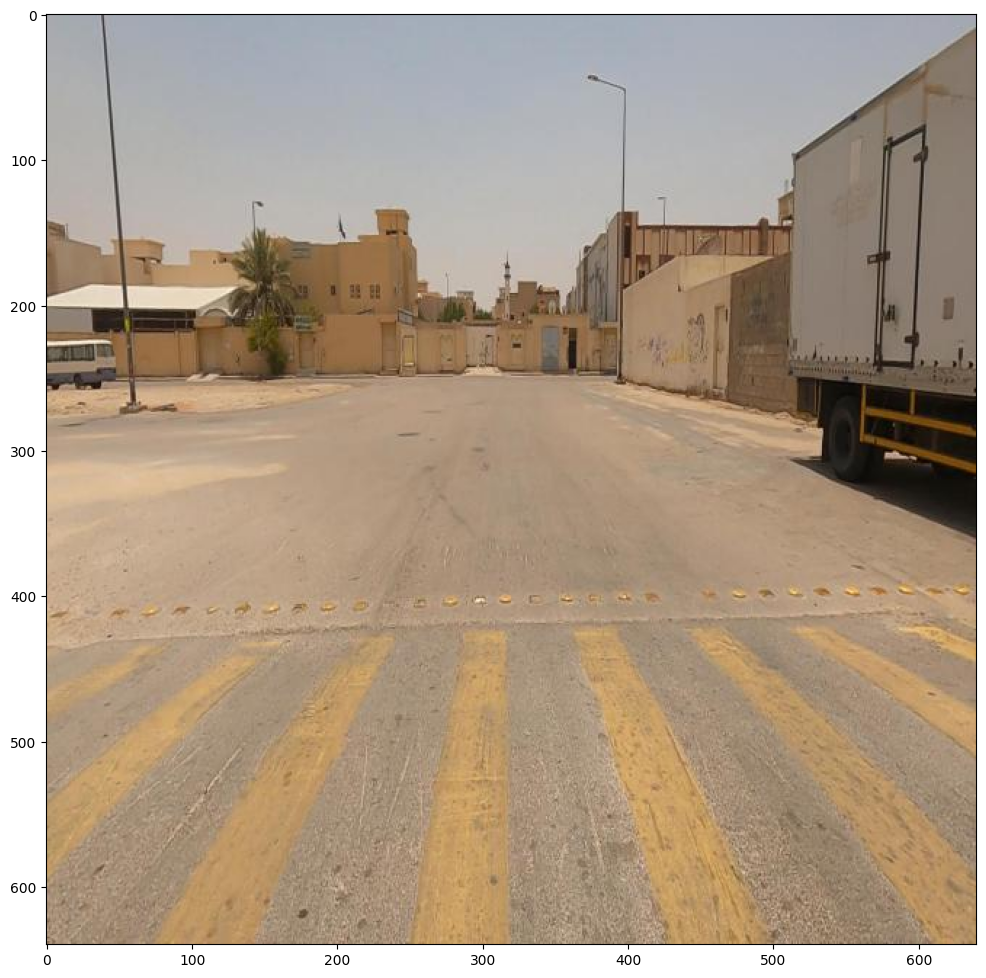

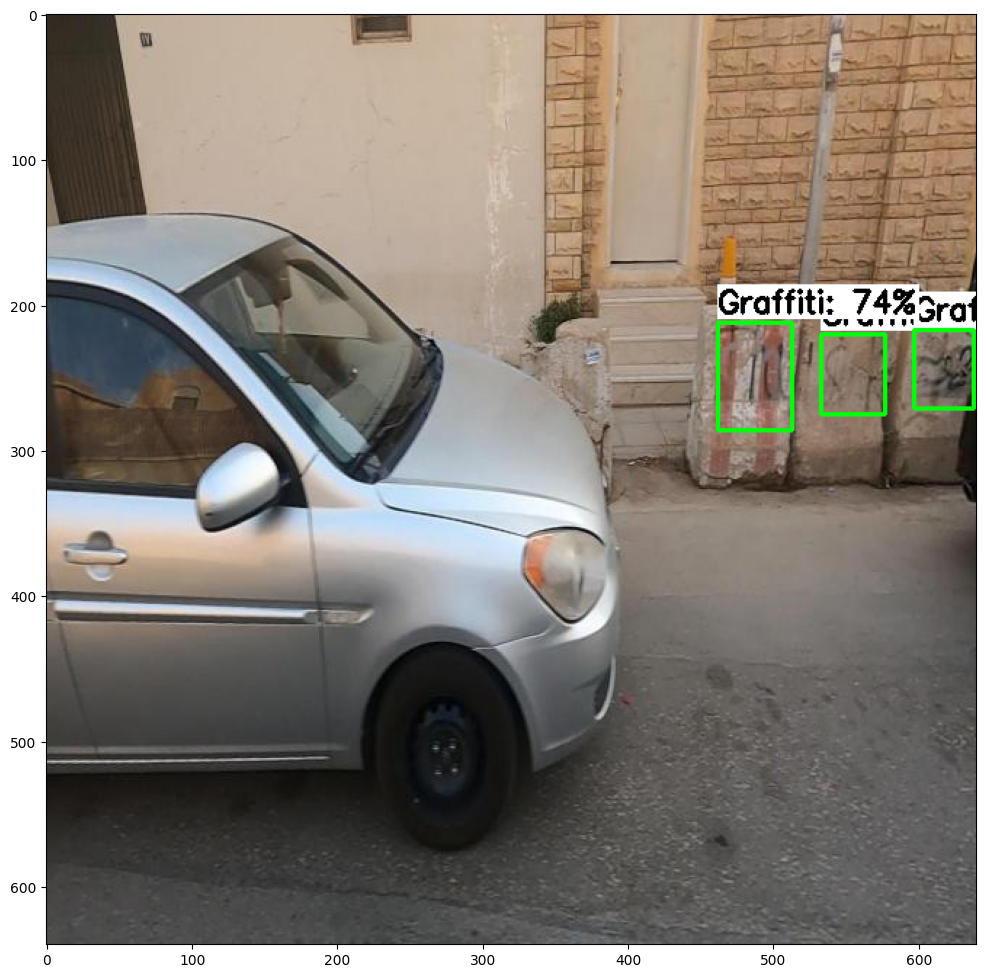

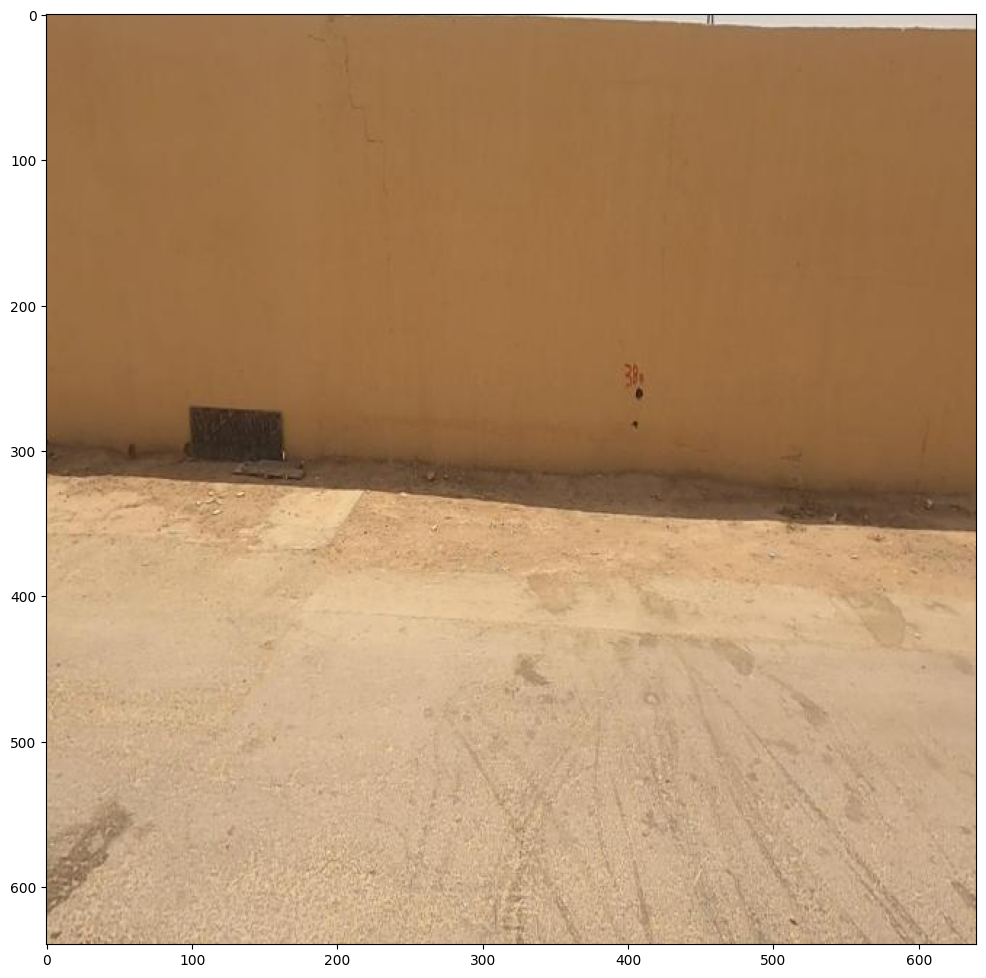

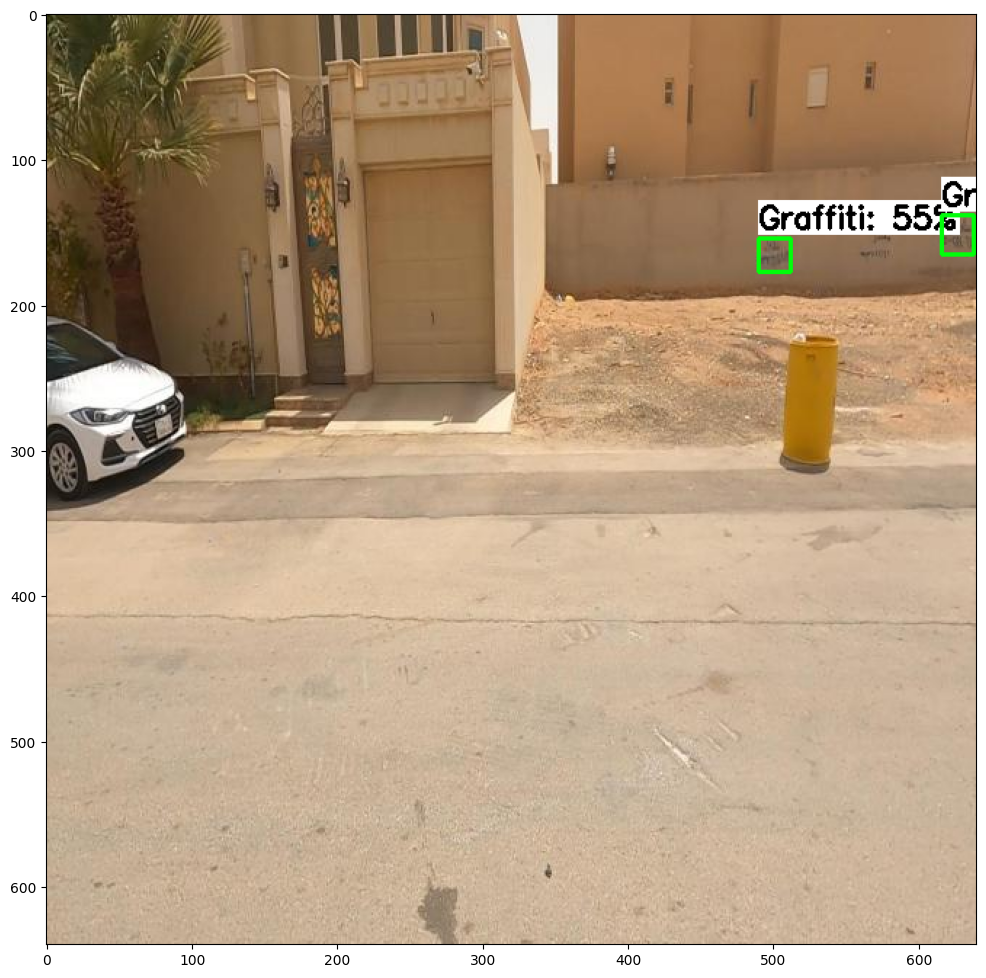

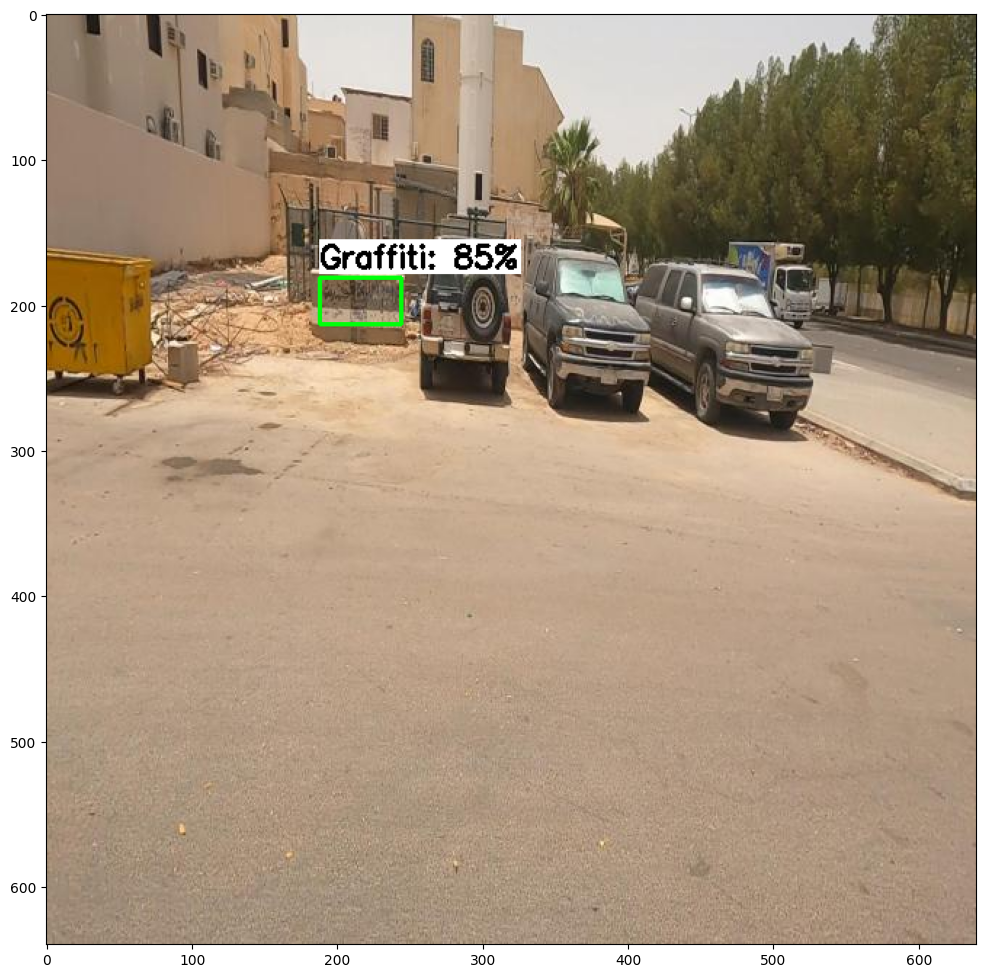

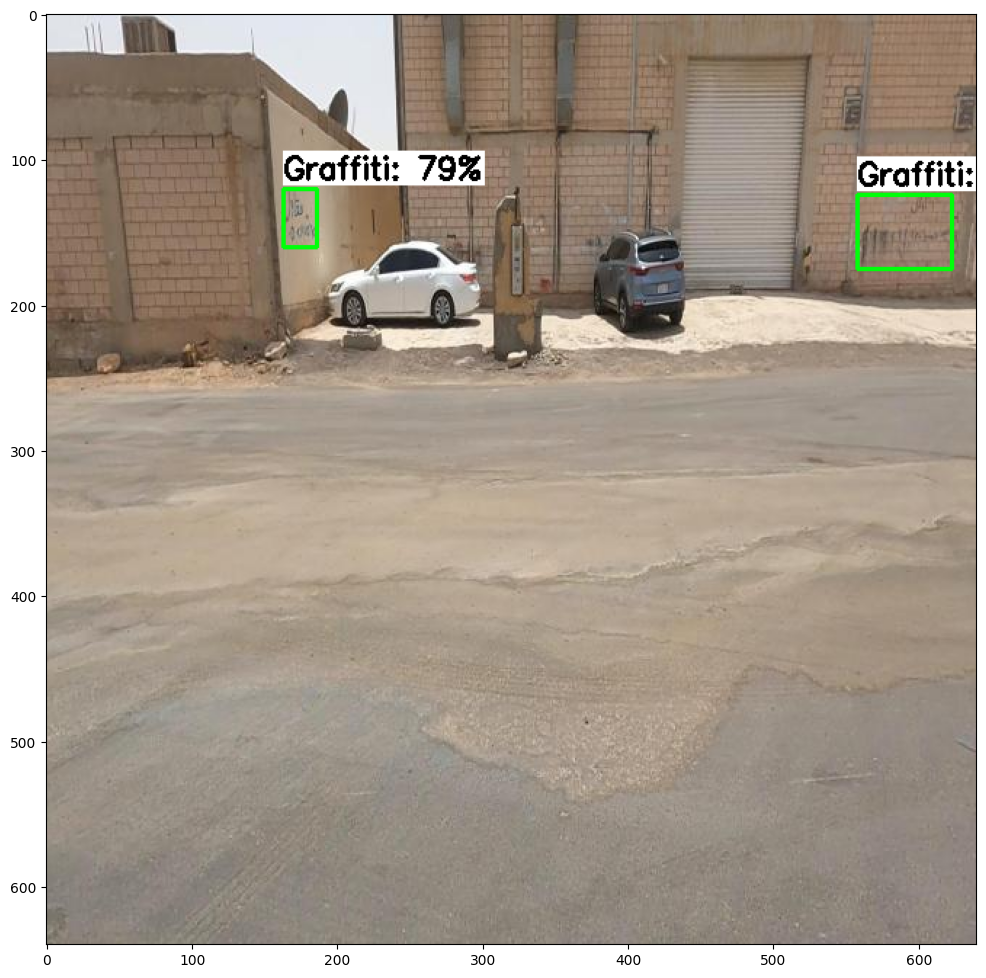

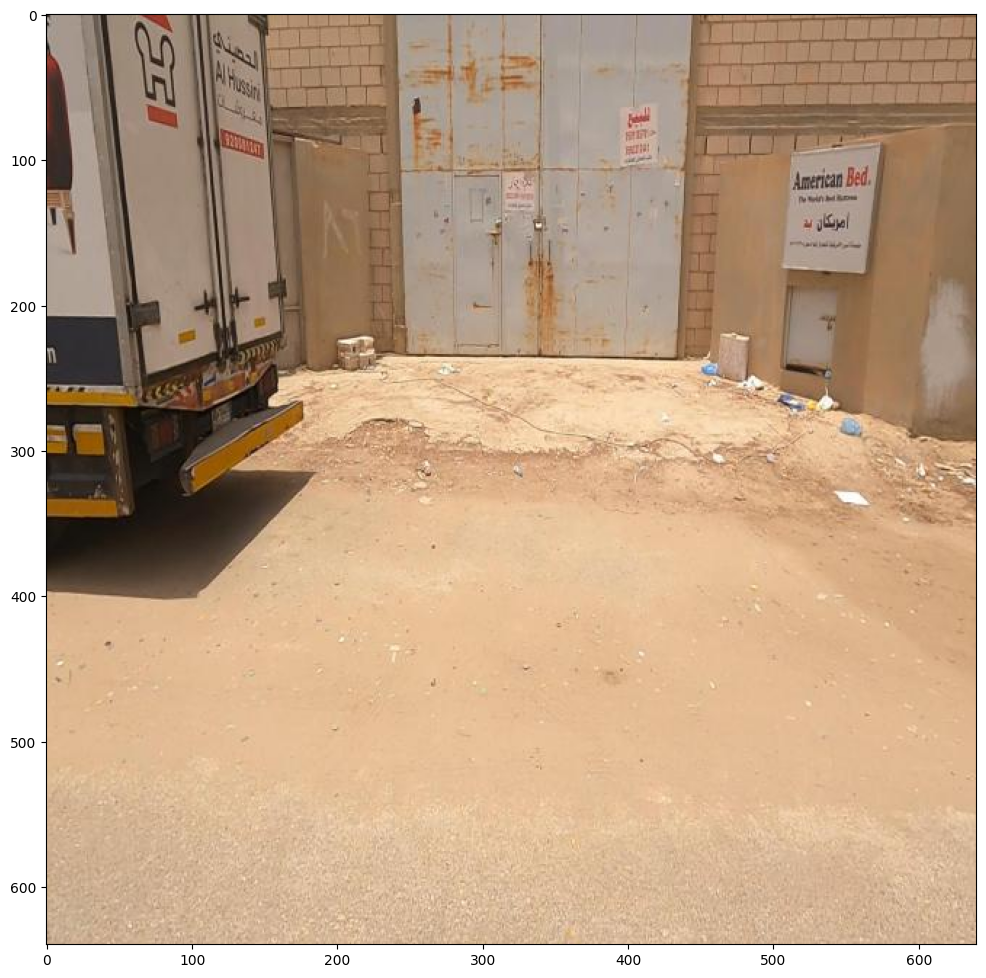

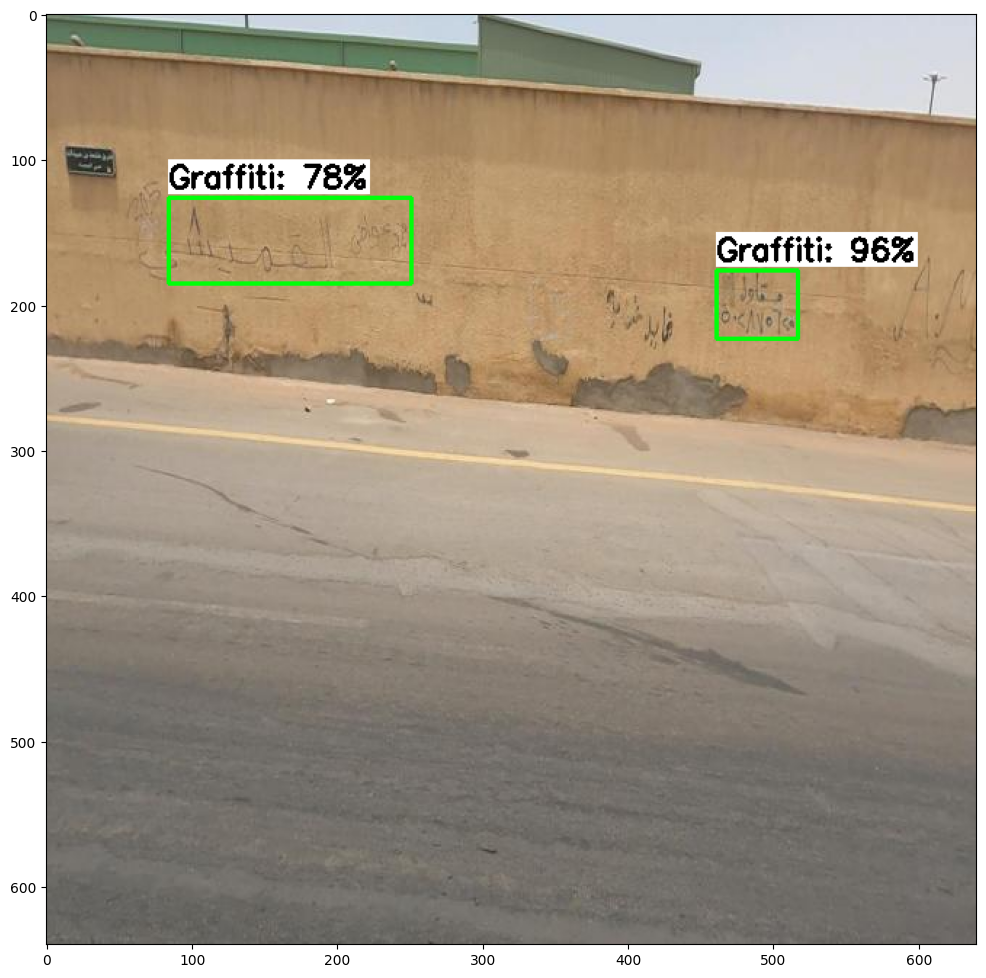

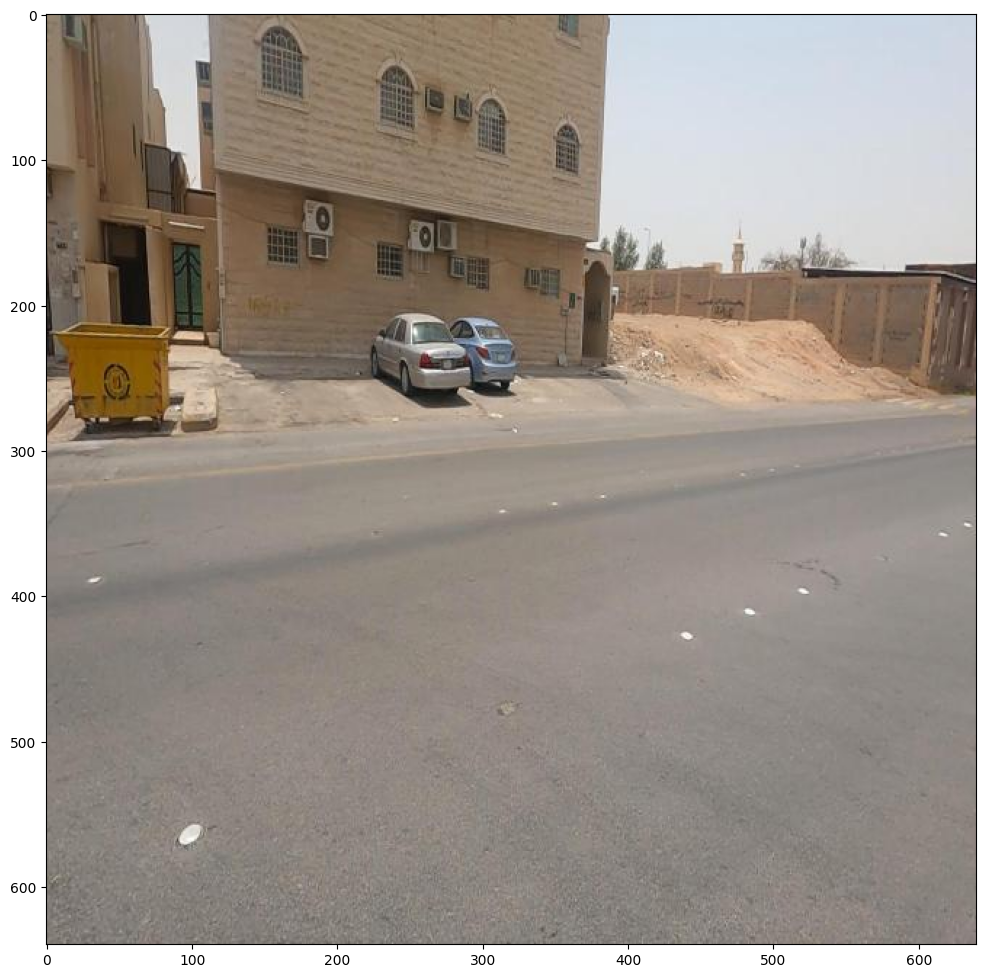

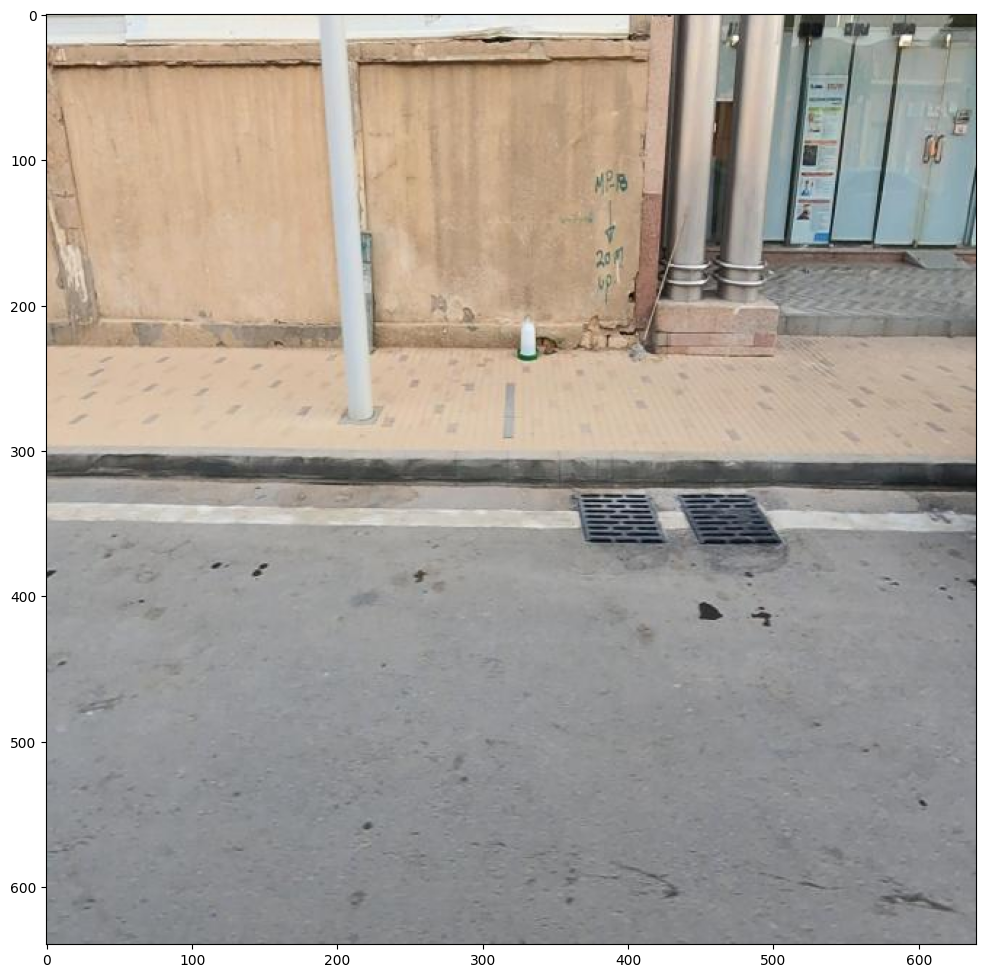

In [7]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/datasets/Graffiti-detection-2/test'   # Path to test images folder
PATH_TO_MODEL='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/model.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/labels.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

In [8]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2024-02-23 08:32:04--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 71.3M=0s

2024-02-23 08:32:04 (71.3 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [9]:
!cp /content/datasets/Graffiti-detection-2/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

In [10]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


In [26]:
import time
import glob

# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/datasets/Graffiti-detection-2/test'   # Path to test images folder
PATH_TO_MODEL='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/model.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/Untitled Folder/model/labels.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold
start_time = time.time()
# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
end_time = time.time()  # Stop timing after inference
total_time = end_time - start_time  # Calculate the total inference time

# Print out the total inference time
print('Finished inferencing! Total inference time: {:.2f} seconds'.format(total_time))

Starting inference on 44 images...
Finished inferencing! Total inference time: 35.36 seconds


In [16]:
%%writefile label_map.txt
Graffiti


Writing label_map.txt


In [18]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/mAP/label_map.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
49.66% = Graffiti AP 
mAP = 49.66%
Calculating mAP at 0.55 IoU threshold...
42.10% = Graffiti AP 
mAP = 42.10%
Calculating mAP at 0.60 IoU threshold...
36.98% = Graffiti AP 
mAP = 36.98%
Calculating mAP at 0.65 IoU threshold...
31.43% = Graffiti AP 
mAP = 31.43%
Calculating mAP at 0.70 IoU threshold...
23.81% = Graffiti AP 
mAP = 23.81%
Calculating mAP at 0.75 IoU threshold...
17.20% = Graffiti AP 
mAP = 17.20%
Calculating mAP at 0.80 IoU threshold...
12.00% = Graffiti AP 
mAP = 12.00%
Calculating mAP at 0.85 IoU threshold...
5.46% = Graffiti AP 
mAP = 5.46%
Calculating mAP at 0.90 IoU threshold...
2.34% = Graffiti AP 
mAP = 2.34%
Calculating mAP at 0.95 IoU threshold...
0.01% = Graffiti AP 
mAP = 0.01%

***mAP Results***

Class		Average mAP @ 0.5:0.95
---------------------------------------
Graffiti		22.10%

Overall		22.10%


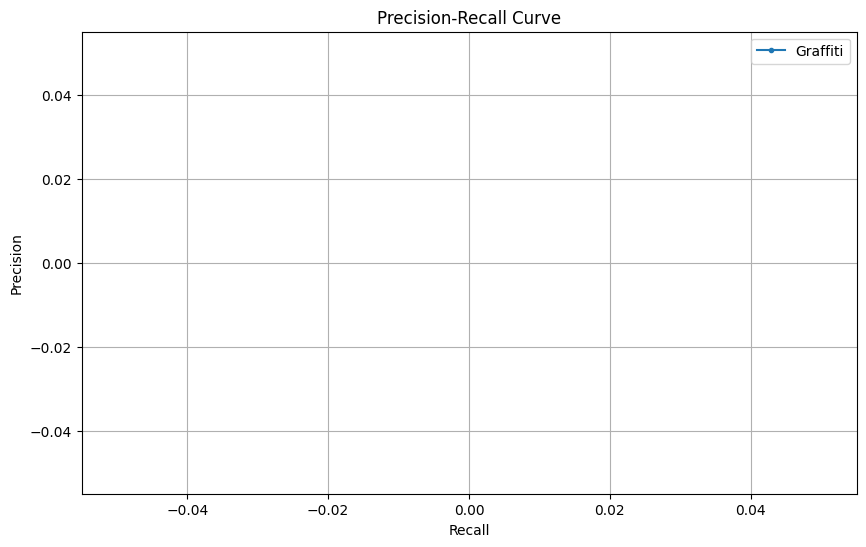

In [19]:
import matplotlib.pyplot as plt

def read_precision_recall(file_path):
    precision = []
    recall = []
    current_list = None

    with open(file_path, 'r') as file:
        for line in file:
            line = line.strip()
            if line.endswith('Precision:'):
                current_list = precision
            elif line.endswith('Recall :'):
                current_list = recall
            elif current_list is not None:
                # Splitting by ',' to handle cases where there's no space after ','
                values = line.strip('[]').split(',')
                current_list.extend([float(value.strip()) for value in values if value.strip()])

    return precision, recall

# Replace 'your_file_path.txt' with the actual file path
precision, recall = read_precision_recall('/content/mAP/outputs/output_iou_0.50/output.txt')

# Plotting the Precision-Recall curve
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Graffiti')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()


In [20]:
import shutil

source_folder = "/content/mAP"
destination_folder = '/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/mAP'

shutil.copytree(source_folder, destination_folder)

'/content/drive/MyDrive/Colab Notebooks/EfficientDet-Lite4/mAP'

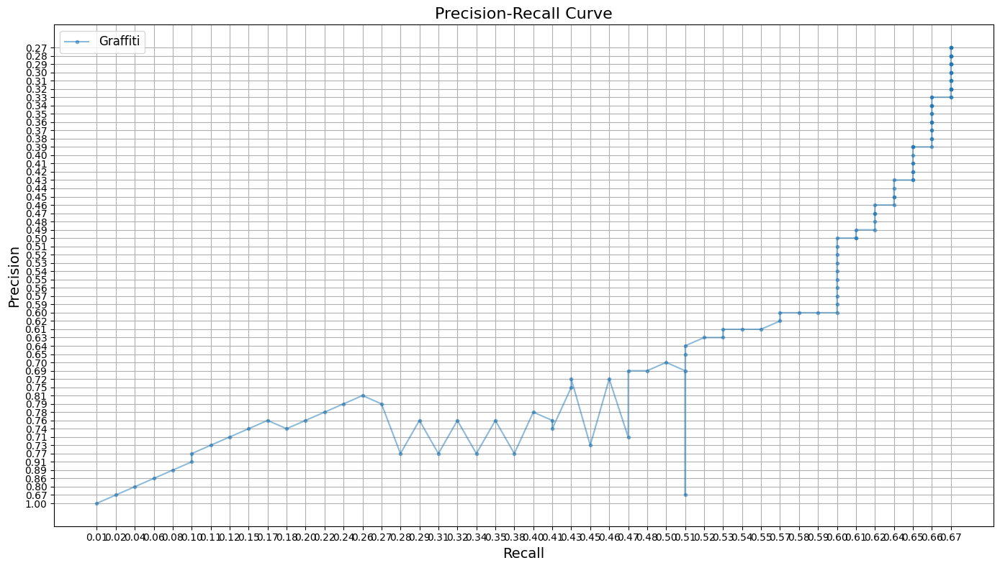

In [23]:
import matplotlib.pyplot as plt

def plot_precision_recall(precision, recall):
    # Convert lists to numpy arrays for better handling
    precision = np.array(precision)
    recall = np.array(recall)

    # Create a larger plot
    plt.figure(figsize=(14, 8))

    # If there are too many points, you can plot a subset of them
    # For example, plot every 10th point:
    skip = max(len(precision) // 100, 1)  # This ensures we don't skip if there are few points

    # Plot with reduced marker density and added line transparency
    plt.plot(recall[::skip], precision[::skip], marker='.', linestyle='-', alpha=0.5, label='Graffiti')

    # Set axis labels and plot title
    plt.xlabel('Recall', fontsize=14)
    plt.ylabel('Precision', fontsize=14)
    plt.title('Precision-Recall Curve', fontsize=16)

    # Add grid, legend, and show plot
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

# Example usage:
# Replace these lists with your actual lists of precision and recall values
precision_values = ['1.00', '1.00', '0.67', '0.75', '0.80', '0.83', '0.86', '0.88', '0.89', '0.90', '0.91', '0.83', '0.77', '0.71', '0.73', '0.75', '0.71', '0.72', '0.74', '0.75', '0.76', '0.73', '0.74', '0.75', '0.76', '0.77', '0.78', '0.79', '0.79', '0.80', '0.81', '0.78', '0.79', '0.79', '0.77', '0.78', '0.76', '0.76', '0.77', '0.78', '0.76', '0.76', '0.77', '0.77', '0.76', '0.76', '0.77', '0.77', '0.78', '0.78', '0.76', '0.75', '0.74', '0.74', '0.75', '0.73', '0.72', '0.72', '0.73', '0.73', '0.72', '0.73', '0.71', '0.70', '0.69', '0.68', '0.69', '0.69', '0.70', '0.69', '0.69', '0.68', '0.67', '0.66', '0.65', '0.64', '0.64', '0.64', '0.63', '0.64', '0.63', '0.62', '0.61', '0.61', '0.61', '0.62', '0.61', '0.61', '0.62', '0.61', '0.60', '0.60', '0.60', '0.60', '0.60', '0.59', '0.60', '0.59', '0.59', '0.58', '0.57', '0.57', '0.56', '0.56', '0.55', '0.55', '0.54', '0.54', '0.53', '0.53', '0.52', '0.52', '0.51', '0.51', '0.50', '0.50', '0.50', '0.50', '0.50', '0.49', '0.49', '0.49', '0.49', '0.48', '0.48', '0.48', '0.47', '0.47', '0.47', '0.46', '0.46', '0.45', '0.46', '0.46', '0.45', '0.45', '0.45', '0.44', '0.44', '0.44', '0.43', '0.43', '0.43', '0.43', '0.43', '0.42', '0.42', '0.42', '0.42', '0.41', '0.41', '0.41', '0.41', '0.40', '0.40', '0.40', '0.39', '0.39', '0.39', '0.39', '0.39', '0.39', '0.39', '0.38', '0.38', '0.38', '0.38', '0.38', '0.37', '0.37', '0.37', '0.37', '0.36', '0.36', '0.36', '0.36', '0.36', '0.35', '0.35', '0.35', '0.35', '0.35', '0.34', '0.34', '0.34', '0.34', '0.34', '0.34', '0.33', '0.33', '0.33', '0.33', '0.33', '0.33', '0.33', '0.33', '0.32', '0.32', '0.32', '0.32', '0.32', '0.32', '0.32', '0.31', '0.31', '0.31', '0.31', '0.31', '0.31', '0.30', '0.30', '0.30', '0.30', '0.30', '0.30', '0.30', '0.29', '0.29', '0.29', '0.29', '0.29', '0.29', '0.29', '0.29', '0.28', '0.28', '0.28', '0.28', '0.28', '0.28', '0.28', '0.28', '0.27', '0.27', '0.27', '0.27', '0.27', '0.27', '0.27']
recall_values = ['0.01', '0.02', '0.02', '0.03', '0.04', '0.05', '0.06', '0.07', '0.08', '0.09', '0.10', '0.10', '0.10', '0.10', '0.11', '0.12', '0.12', '0.14', '0.15', '0.16', '0.17', '0.17', '0.18', '0.19', '0.20', '0.21', '0.22', '0.23', '0.24', '0.25', '0.26', '0.26', '0.27', '0.28', '0.28', '0.29', '0.29', '0.30', '0.31', '0.32', '0.32', '0.33', '0.34', '0.35', '0.35', '0.36', '0.38', '0.39', '0.40', '0.41', '0.41', '0.41', '0.41', '0.42', '0.43', '0.43', '0.43', '0.44', '0.45', '0.46', '0.46', '0.47', '0.47', '0.47', '0.47', '0.47', '0.48', '0.49', '0.50', '0.50', '0.51', '0.51', '0.51', '0.51', '0.51', '0.51', '0.51', '0.52', '0.52', '0.53', '0.53', '0.53', '0.53', '0.53', '0.54', '0.55', '0.55', '0.56', '0.57', '0.57', '0.57', '0.57', '0.58', '0.58', '0.59', '0.59', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.60', '0.61', '0.61', '0.61', '0.61', '0.61', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.62', '0.64', '0.64', '0.64', '0.64', '0.64', '0.64', '0.64', '0.64', '0.64', '0.64', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.65', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.66', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67', '0.67']

plot_precision_recall(precision_values, recall_values)
